In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.patches import Circle
import pydicom
import os
import glob
import cv2
from tqdm import tqdm
import re

In [2]:
INPUT_DIR = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification'
TRAIN_PNG_DIR = '/train_pngs'
TEST_PNG_DIR = '/test_pngs'
OUTPUT_DIR = '/kaggle/working'

train_df = pd.read_csv(f'{INPUT_DIR}/train.csv')
desc_df = pd.read_csv(f'{INPUT_DIR}/train_series_descriptions.csv')
coord_df = pd.read_csv(f'{INPUT_DIR}/train_label_coordinates.csv')

In [3]:
# test_images
# test_series_descriptions.csv

# train_images
# train_label_coordinates.csv --> xy coordinates with image number
# train_series_descriptions.csv --> imaging types (Axial T1, Saggital T1, Saggital T2/STIR)
# train.csv --> severity in 25 channels

In [4]:
train_df.head()

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,4003253,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
1,4646740,Normal/Mild,Normal/Mild,Moderate,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Moderate,Moderate,Moderate,Normal/Mild
2,7143189,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
3,8785691,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
4,10728036,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild


In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1975 entries, 0 to 1974
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   study_id                                1975 non-null   int64 
 1   spinal_canal_stenosis_l1_l2             1974 non-null   object
 2   spinal_canal_stenosis_l2_l3             1974 non-null   object
 3   spinal_canal_stenosis_l3_l4             1974 non-null   object
 4   spinal_canal_stenosis_l4_l5             1974 non-null   object
 5   spinal_canal_stenosis_l5_s1             1974 non-null   object
 6   left_neural_foraminal_narrowing_l1_l2   1973 non-null   object
 7   left_neural_foraminal_narrowing_l2_l3   1973 non-null   object
 8   left_neural_foraminal_narrowing_l3_l4   1973 non-null   object
 9   left_neural_foraminal_narrowing_l4_l5   1973 non-null   object
 10  left_neural_foraminal_narrowing_l5_s1   1973 non-null   object
 11  righ

In [6]:
null_counts = train_df.isnull().sum()
for column, count in null_counts.items():
    print(f"{column}: {count}")

study_id: 0
spinal_canal_stenosis_l1_l2: 1
spinal_canal_stenosis_l2_l3: 1
spinal_canal_stenosis_l3_l4: 1
spinal_canal_stenosis_l4_l5: 1
spinal_canal_stenosis_l5_s1: 1
left_neural_foraminal_narrowing_l1_l2: 2
left_neural_foraminal_narrowing_l2_l3: 2
left_neural_foraminal_narrowing_l3_l4: 2
left_neural_foraminal_narrowing_l4_l5: 2
left_neural_foraminal_narrowing_l5_s1: 2
right_neural_foraminal_narrowing_l1_l2: 8
right_neural_foraminal_narrowing_l2_l3: 8
right_neural_foraminal_narrowing_l3_l4: 8
right_neural_foraminal_narrowing_l4_l5: 8
right_neural_foraminal_narrowing_l5_s1: 8
left_subarticular_stenosis_l1_l2: 164
left_subarticular_stenosis_l2_l3: 82
left_subarticular_stenosis_l3_l4: 3
left_subarticular_stenosis_l4_l5: 3
left_subarticular_stenosis_l5_s1: 11
right_subarticular_stenosis_l1_l2: 161
right_subarticular_stenosis_l2_l3: 82
right_subarticular_stenosis_l3_l4: 2
right_subarticular_stenosis_l4_l5: 2
right_subarticular_stenosis_l5_s1: 7


In [7]:
for column in train_df.columns:
    print(f"{column}: {train_df[column].unique()}")

study_id: [   4003253    4646740    7143189 ... 4284048608 4287160193 4290709089]
spinal_canal_stenosis_l1_l2: ['Normal/Mild' 'Moderate' 'Severe' nan]
spinal_canal_stenosis_l2_l3: ['Normal/Mild' 'Moderate' 'Severe' nan]
spinal_canal_stenosis_l3_l4: ['Normal/Mild' 'Moderate' 'Severe' nan]
spinal_canal_stenosis_l4_l5: ['Normal/Mild' 'Severe' 'Moderate' nan]
spinal_canal_stenosis_l5_s1: ['Normal/Mild' 'Moderate' 'Severe' nan]
left_neural_foraminal_narrowing_l1_l2: ['Normal/Mild' 'Moderate' 'Severe' nan]
left_neural_foraminal_narrowing_l2_l3: ['Normal/Mild' 'Moderate' 'Severe' nan]
left_neural_foraminal_narrowing_l3_l4: ['Normal/Mild' 'Moderate' 'Severe' nan]
left_neural_foraminal_narrowing_l4_l5: ['Moderate' 'Normal/Mild' 'Severe' nan]
left_neural_foraminal_narrowing_l5_s1: ['Normal/Mild' 'Moderate' 'Severe' nan]
right_neural_foraminal_narrowing_l1_l2: ['Normal/Mild' 'Severe' 'Moderate' nan]
right_neural_foraminal_narrowing_l2_l3: ['Normal/Mild' 'Moderate' 'Severe' nan]
right_neural_foram

In [8]:
desc_df.head()

,study_id,series_id,series_description
0,4003253,702807833,Sagittal T2/STIR
1,4003253,1054713880,Sagittal T1
2,4003253,2448190387,Axial T2
3,4646740,3201256954,Axial T2
4,4646740,3486248476,Sagittal T1


In [9]:
desc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6294 entries, 0 to 6293
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   study_id            6294 non-null   int64 
 1   series_id           6294 non-null   int64 
 2   series_description  6294 non-null   object
dtypes: int64(2), object(1)
memory usage: 147.6+ KB


In [10]:
null_counts = desc_df.isnull().sum()
for column, count in null_counts.items():
    print(f"{column}: {count}")

study_id: 0
series_id: 0
series_description: 0


In [11]:
for column in desc_df.columns:
    print(f"{column}: {desc_df[column].unique()}")

study_id: [   4003253    4646740    7143189 ... 4284048608 4287160193 4290709089]
series_id: [ 702807833 1054713880 2448190387 ... 3274612423 3390218084 4237840455]
series_description: ['Sagittal T2/STIR' 'Sagittal T1' 'Axial T2']


In [12]:
series_counts = desc_df.groupby('study_id')['series_id'].count()
print(f"Min series per study: {series_counts.min()}")
print(f"Max series per study: {series_counts.max()}")

Min series per study: 2
Max series per study: 6


In [13]:
print(desc_df['series_description'].value_counts())

series_description
Axial T2            2340
Sagittal T1         1980
Sagittal T2/STIR    1974
Name: count, dtype: int64


In [14]:
coord_df.head()

,study_id,series_id,instance_number,condition,level,x,y
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602


In [15]:
coord_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48692 entries, 0 to 48691
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   study_id         48692 non-null  int64  
 1   series_id        48692 non-null  int64  
 2   instance_number  48692 non-null  int64  
 3   condition        48692 non-null  object 
 4   level            48692 non-null  object 
 5   x                48692 non-null  float64
 6   y                48692 non-null  float64
dtypes: float64(2), int64(3), object(2)
memory usage: 2.6+ MB


In [16]:
desc_df[desc_df['study_id']==4096820034]

,study_id,series_id,series_description
5997,4096820034,300517765,Axial T2
5998,4096820034,2097107888,Axial T2
5999,4096820034,2602265508,Sagittal T2/STIR
6000,4096820034,2679683906,Axial T2
6001,4096820034,3114813181,Axial T2
6002,4096820034,3236751045,Sagittal T1


In [17]:
coord_df[coord_df['study_id']==4096820034]

,study_id,series_id,instance_number,condition,level,x,y
46392,4096820034,300517765,5,Right Subarticular Stenosis,L4/L5,305.500000,372.444444
46393,4096820034,300517765,11,Right Subarticular Stenosis,L5/S1,298.388889,358.222222
46394,4096820034,2097107888,10,Left Subarticular Stenosis,L1/L2,348.379062,378.070442
46395,4096820034,2097107888,16,Left Subarticular Stenosis,L2/L3,344.193491,369.699299
46396,4096820034,2097107888,22,Left Subarticular Stenosis,L3/L4,342.100705,359.235371
46397,4096820034,2602265508,7,Spinal Canal Stenosis,L1/L2,268.706316,88.525822
46398,4096820034,2602265508,7,Spinal Canal Stenosis,L2/L3,257.288476,135.399061
46399,4096820034,2602265508,7,Spinal Canal Stenosis,L3/L4,247.673452,180.469484
46400,4096820034,2602265508,7,Spinal Canal Stenosis,L4/L5,244.668757,220.732394
46401,4096820034,2602265508,7,Spinal Canal Stenosis,L5/S1,253.081903,260.394366


In [18]:
# Axial T2 --> Left/Right Subarticular Stenosis
# Sagittal T1 --> Left/Right Neural Foraminal Narrowing
# Sagittal T2/STIR --> Spinal Canal Stenosis

In [19]:
def get_study_series_info(study_id=None, series_id=None):
    if study_id is None or series_id is None:
        # Get the first study and series if not specified
        first_row = desc_df.iloc[0]
        study_id = first_row['study_id']
        series_id = first_row['series_id']
    
    series_info = desc_df[(desc_df['study_id'] == study_id) & 
                          (desc_df['series_id'] == series_id)].iloc[0]
    return series_info

def load_dcm_files(study_id, series_id):
    study_path = f'{INPUT_DIR}/train_images/{study_id}/{series_id}'
    dcm_files = sorted(glob.glob(f"{study_path}/*.dcm"), key=lambda x: int(os.path.splitext(os.path.basename(x))[0]))
    images = []
    for dcm_file in dcm_files:
        dcm = pydicom.dcmread(dcm_file)
        image = dcm.pixel_array
        images.append(image)
    return images

def get_coordinates(study_id, series_id):
    coords = coord_df[(coord_df['study_id'] == study_id) & 
                      (coord_df['series_id'] == series_id)]
    return coords

In [ ]:
def display_series_grid(study_id=None, series_id=None, images_per_row=4):
    series_info = get_study_series_info(study_id, series_id)
    study_id, series_id = series_info['study_id'], series_info['series_id']
    
    images = load_dcm_files(study_id, series_id)
    total_images = len(images)
    rows = (total_images + images_per_row - 1) // images_per_row

    fig = plt.figure(figsize=(5*images_per_row, 5*rows))
    fig.suptitle(f"Study ID: {study_id}, Series ID: {series_id}\n"
                 f"Series Description: {series_info['series_description']}\n"
                 f"Total Images: {total_images}", fontsize=16)

    for i, image in enumerate(images, 1):
        ax = plt.subplot(rows, images_per_row, i)
        ax.imshow(image, cmap='gray')
        ax.set_title(f"Image {i}", fontsize=10)
        ax.axis('off')

    plt.tight_layout()
    plt.show()
    
display_series_grid()

# display_series_grid(study_id=4096820034, series_id=300517765)

In [ ]:
from IPython.display import HTML

def animate_series(study_id=None, series_id=None):
    series_info = get_study_series_info(study_id, series_id)
    study_id, series_id = series_info['study_id'], series_info['series_id']
    
    images = load_dcm_files(study_id, series_id)
    
    fig = plt.figure(figsize=(10, 10))
    plt.axis('off')
    im = plt.imshow(images[0], cmap='gray', animated=True)
    
    title = plt.title(f"Study ID: {study_id}, Series ID: {series_id}\n"
                      f"Series Description: {series_info['series_description']}\n"
                      f"Image: 1/{len(images)}", fontsize=12)

    def updatefig(frame):
        im.set_array(images[frame])
        title.set_text(f"Study ID: {study_id}, Series ID: {series_id}\n"
                       f"Series Description: {series_info['series_description']}\n"
                       f"Image: {frame+1}/{len(images)}")
        return im, title

    anim = animation.FuncAnimation(fig, updatefig, frames=len(images),
                                   interval=200, blit=True)
    plt.close(fig)
    return anim

anim = animate_series()
HTML(anim.to_jshtml())

# anim = animate_series(study_id=4096820034, series_id=300517765)
# HTML(anim.to_jshtml())

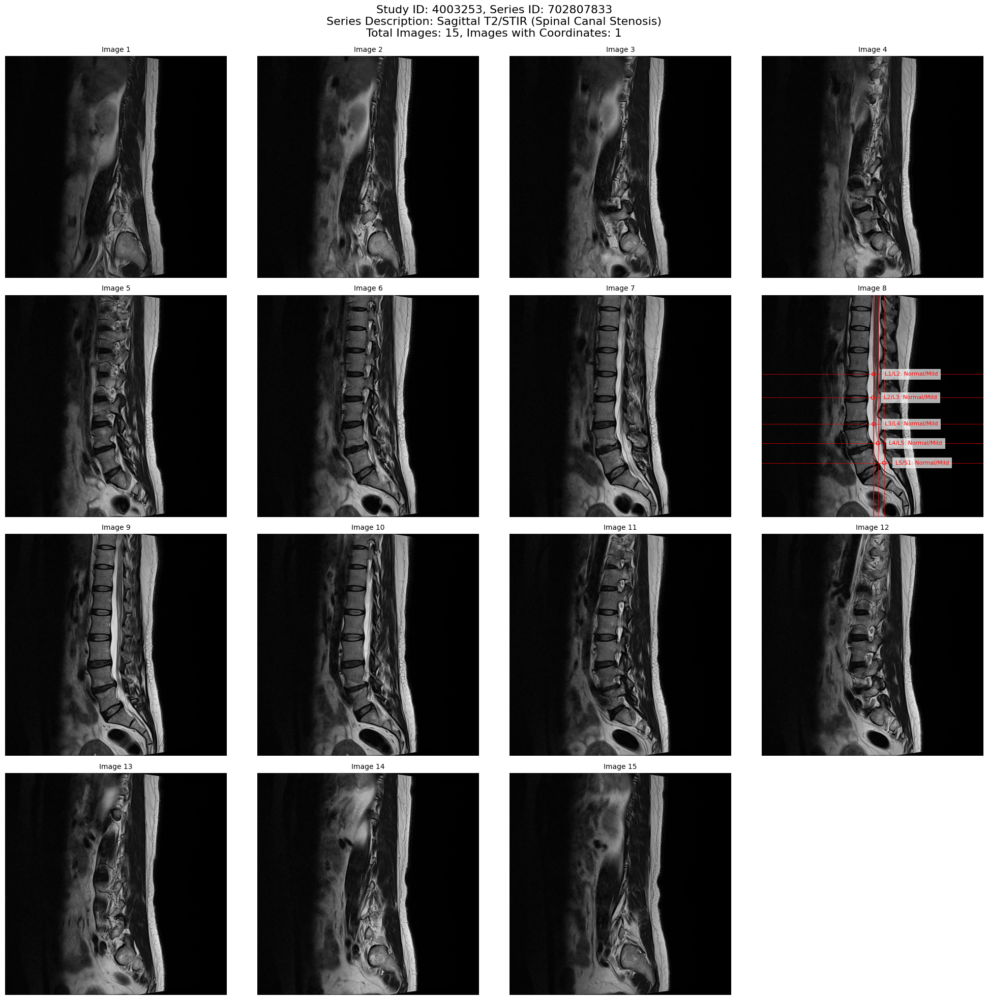

In [27]:
def display_series_grid_with_coordinates(study_id=None, series_id=None, images_per_row=4):
    series_info = get_study_series_info(study_id, series_id)
    study_id, series_id = series_info['study_id'], series_info['series_id']
    
    images = load_dcm_files(study_id, series_id)
    coords = get_coordinates(study_id, series_id)
    
    total_images = len(images)
    images_with_coords = coords['instance_number'].nunique()
    rows = (total_images + images_per_row - 1) // images_per_row

    # Determine the condition based on series description
    series_description = series_info['series_description']
    if 'Axial T2' in series_description:
        condition = 'Left/Right Subarticular Stenosis'
    elif 'Sagittal T1' in series_description:
        condition = 'Left/Right Neural Foraminal Narrowing'
    elif 'Sagittal T2/STIR' in series_description:
        condition = 'Spinal Canal Stenosis'
    else:
        condition = 'Unknown'

    # Get severity information from train_df
    study_data = train_df[train_df['study_id'] == study_id].iloc[0]

    fig = plt.figure(figsize=(5*images_per_row, 5*rows))
    title = fig.suptitle(f"Study ID: {study_id}, Series ID: {series_id}\n"
                         f"Series Description: {series_description} ({condition})\n"
                         f"Total Images: {total_images}, Images with Coordinates: {images_with_coords}", 
                         fontsize=16)
    title.set_y(0.98)  # Adjust the position of the main title

    for i, image in enumerate(images, 1):
        ax = plt.subplot(rows, images_per_row, i)
        ax.imshow(image, cmap='gray')
        
        # Add crosshairs and circles for coordinates and severity information
        image_coords = coords[coords['instance_number'] == i]
        for _, coord in image_coords.iterrows():
            ax.axvline(x=coord['x'], color='r', linewidth=0.5)
            ax.axhline(y=coord['y'], color='r', linewidth=0.5)
            
            # Add red circle
            circle = Circle((coord['x'], coord['y']), 5, fill=False, ec='r')
            ax.add_patch(circle)
            
            # Determine severity based on condition and level
            level = coord['level'].lower().replace('/', '_')
            if condition == 'Spinal Canal Stenosis':
                col_name = f'spinal_canal_stenosis_{level}'
            elif condition == 'Left/Right Neural Foraminal Narrowing':
                side = coord['condition'].split()[0].lower()
                col_name = f'{side}_neural_foraminal_narrowing_{level}'
            elif condition == 'Left/Right Subarticular Stenosis':
                side = coord['condition'].split()[0].lower()
                col_name = f'{side}_subarticular_stenosis_{level}'
            else:
                col_name = None

            severity = study_data.get(col_name, 'Unknown') if col_name else 'Unknown'
            
            # Display severity to the right of the crosshair
            text_x = coord['x'] + image.shape[1] * 0.05  # 5% of image width to the right
            ax.text(text_x, coord['y'], f"{coord['level']}: {severity}", color='r', fontsize=8, 
                    bbox=dict(facecolor='white', edgecolor='none', alpha=0.7),
                    verticalalignment='center')
        
        ax.set_title(f"Image {i}", fontsize=10)
        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()
    
display_series_grid_with_coordinates()

# display_series_grid_with_coordinates(study_id=4096820034, series_id=300517765)

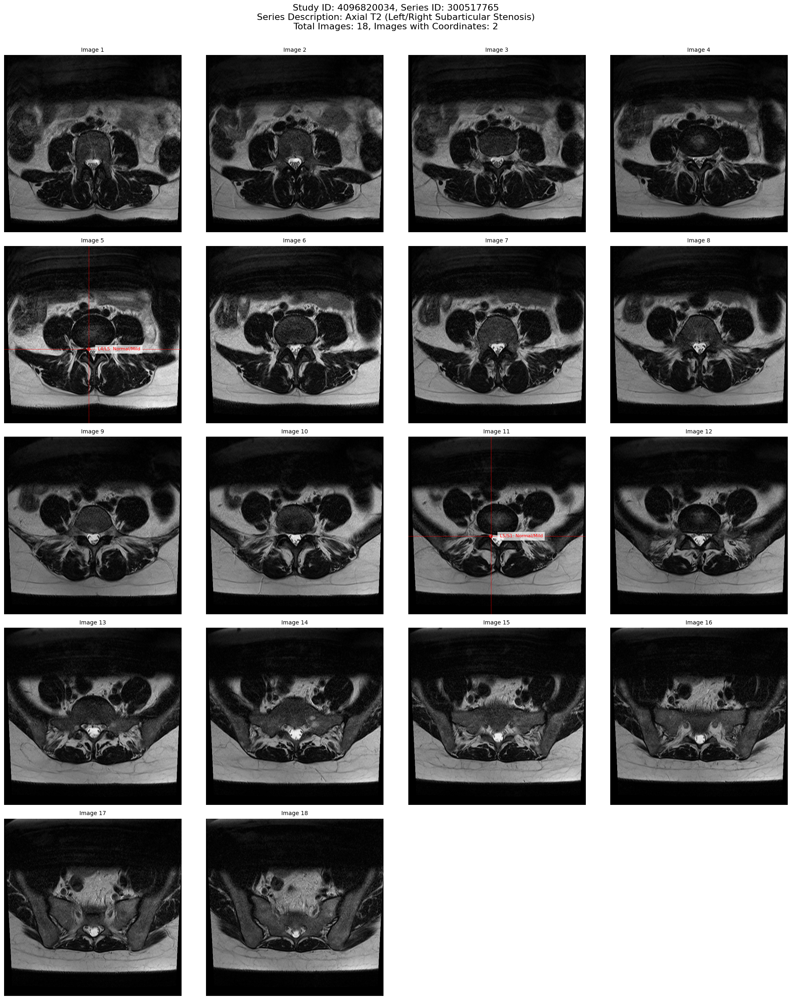

In [28]:
display_series_grid_with_coordinates(study_id=4096820034, series_id=300517765)

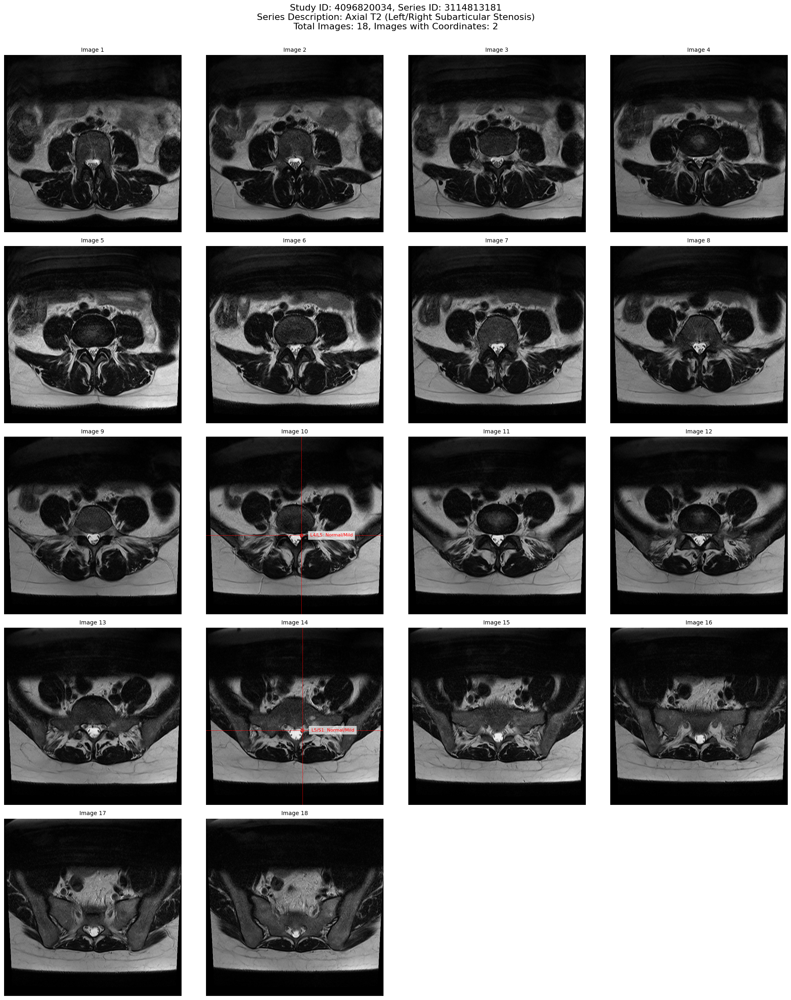

In [29]:
display_series_grid_with_coordinates(study_id=4096820034, series_id=3114813181)

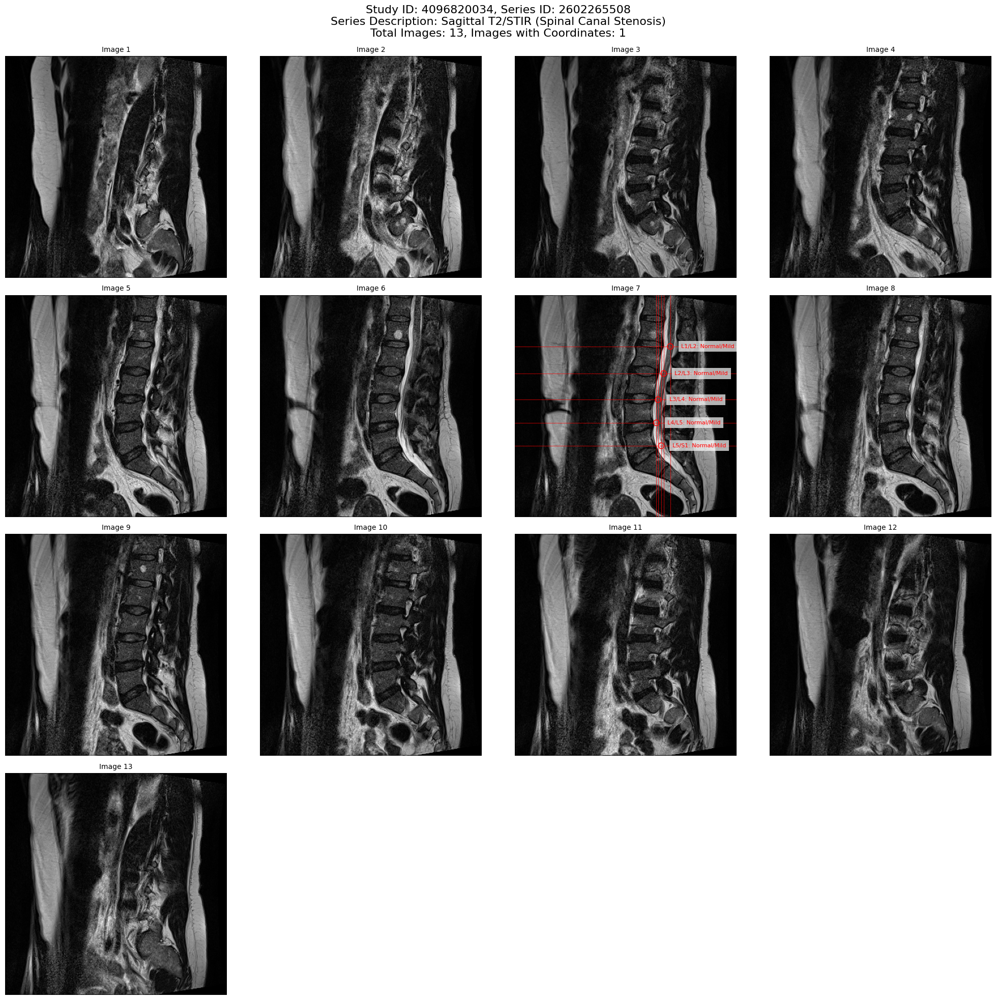

In [30]:
display_series_grid_with_coordinates(study_id=4096820034, series_id=2602265508)

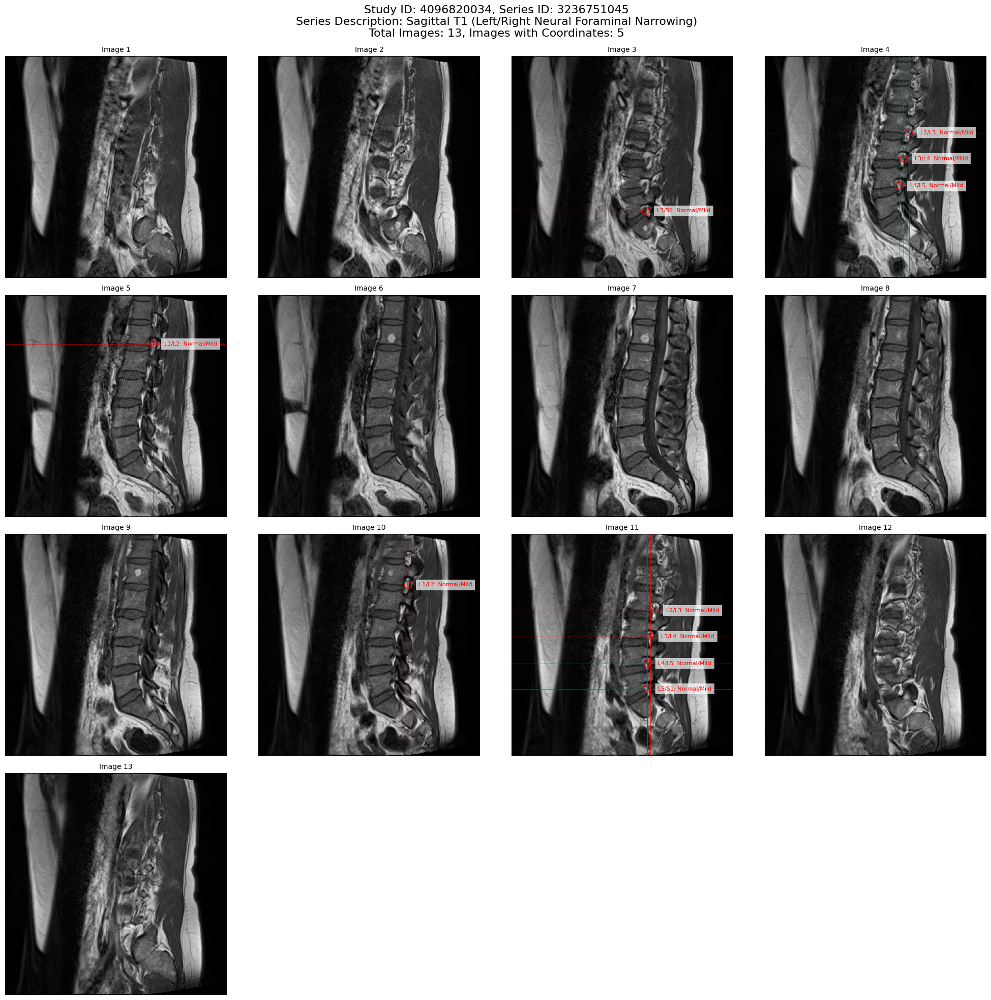

In [31]:
display_series_grid_with_coordinates(study_id=4096820034, series_id=3236751045)

In [24]:
def natural_sort_key(text):
    return [int(c) if c.isdigit() else c.lower() for c in re.split(r'(\d+)', text)]

def convert_dcm_to_png(input_path, output_path):
    dcm_data = pydicom.dcmread(input_path)
    image = dcm_data.pixel_array
    normalized_image = (image - image.min()) / (image.max() - image.min()) * 255
    resized_image = cv2.resize(normalized_image, (512, 512), interpolation=cv2.INTER_CUBIC)
    cv2.imwrite(output_path, resized_image)

def process_series_conversion(study_id, image_type, series_data):
    output_folder = f'{OUTPUT_DIR}/{study_id}/{image_type.replace("/", "_")}'
    os.makedirs(output_folder, exist_ok=True)

    all_images = []
    for _, row in series_data.iterrows():
        dcm_files = glob.glob(f'{INPUT_DIR}/train_images/{row["study_id"]}/{row["series_id"]}/*.dcm')
        all_images.extend(sorted(dcm_files, key=natural_sort_key))

    if not all_images:
        print(f'{study_id} {image_type} has no images')
        return

    if image_type == 'Axial T2':
        for index, image_path in enumerate(all_images):
            output_path = f'{output_folder}/{index:03d}.png'
            convert_dcm_to_png(image_path, output_path)
    else:
        num_output_images = min(10, len(all_images))
        indices = np.linspace(0, len(all_images) - 1, num_output_images, dtype=int)
        for output_index, input_index in enumerate(indices):
            output_path = f'{output_folder}/{output_index:03d}.png'
            convert_dcm_to_png(all_images[input_index], output_path)

os.makedirs(OUTPUT_DIR, exist_ok=True)
study_ids = desc_df['study_id'].unique()

for study_id in tqdm(study_ids):
    study_data = desc_df[desc_df['study_id'] == study_id]
    for image_type in ['Sagittal T2/STIR', 'Sagittal T1', 'Axial T2']:
        image_type_data = study_data[study_data['series_description'] == image_type]
        process_series_conversion(study_id, image_type, image_type_data)

 57%|█████▋    | 1126/1975 [35:06<23:02,  1.63s/it] 

2492114990 Sagittal T1 has no images


 64%|██████▍   | 1272/1975 [39:28<18:29,  1.58s/it]

2780132468 Sagittal T1 has no images


 70%|██████▉   | 1378/1975 [42:46<15:27,  1.55s/it]

3008676218 Sagittal T2/STIR has no images


100%|██████████| 1975/1975 [1:01:29<00:00,  1.87s/it]


In [1]:
pwd()

# INPUT_PATH, OUTPUT_PATH로 바꾸자
# png 폴더명을 AxialT2, SagittalT1, SagittalT2STIR로 바꾸자
# 같은 타입인데 시리즈가 다르다면?

'/kaggle/working'

In [ ]:
import os
import numpy as np
import pandas as pd
from glob import glob
from PIL import Image
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torch.optim import AdamW
import timm
from transformers import get_cosine_schedule_with_warmup
import albumentations as A
from sklearn.model_selection import KFold
from tqdm import tqdm

In [1]:
IMG_SIZE = [512, 512]
IN_CHANS = 30
N_LABELS = 25
N_CLASSES = 3 * N_LABELS
N_FOLDS = 5 # k-fold cross-validation
EPOCHS = 20
MODEL_NAME = "tf_efficientnet_b3.ns_jft_in1k"
BATCH_SIZE = 16
LR = 2e-4
WD = 1e-2

# N_CHANNELS로 바꿀 것

In [ ]:
class RSNA24Dataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
    
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        x = np.zeros((512, 512, IN_CHANS), dtype=np.uint8)
        row = self.df.iloc[idx]
        study_id = int(row['study_id'])
        label = row[1:].values.astype(np.int64)
        
        # Load Sagittal T1 images
        self.load_sequence(x, study_id, "Sagittal T1", 0)
        
        # Load Sagittal T2/STIR images
        self.load_sequence(x, study_id, "Sagittal T2_STIR", 10)
        
        # Load Axial T2 images
        self.load_axial_t2(x, study_id)

        if self.transform:
            x = self.transform(image=x)['image']
        x = x.transpose(2, 0, 1)
                
        return x, label

    def load_sequence(self, x, study_id, sequence_type, start_channel):
        for i in range(10):
            try:
                img_path = f'./cvt_png/{study_id}/{sequence_type}/{i:03d}.png'
                img = np.array(Image.open(img_path).convert('L'))
                x[..., start_channel + i] = img
            except:
                pass

    def load_axial_t2(self, x, study_id):
        axial_t2_files = sorted(glob(f'./cvt_png/{study_id}/Axial T2/*.png'))
        num_files = len(axial_t2_files)
        indices = np.linspace(0, num_files - 1, 10).astype(int)
        for i, idx in enumerate(indices):
            if idx < num_files:
                img = np.array(Image.open(axial_t2_files[idx]).convert('L'))
                x[..., 20 + i] = img
                
# x[:, :, start_channel + i]로 바꿀 것
# load 함수들 단순화
# cvt_png -> OUTPUT_DIR + TRAIN_PNG

In [ ]:
class RSNA24Model(nn.Module):
    def __init__(self, model_name, in_chans, n_classes):
        super().__init__()
        self.model = timm.create_model(
            model_name,
            pretrained=True,
            in_chans=in_chans,
            num_classes=n_classes
        )
    
    def forward(self, x):
        return self.model(x)

In [ ]:
# Data augmentation
transforms_train = A.Compose([
    A.RandomBrightnessContrast(p=0.75),
    A.ShiftScaleRotate(p=0.75),
    A.Resize(IMG_SIZE[0], IMG_SIZE[1]),
    A.Normalize(mean=0.5, std=0.5)
])

transforms_val = A.Compose([
    A.Resize(IMG_SIZE[0], IMG_SIZE[1]),
    A.Normalize(mean=0.5, std=0.5)
])

In [ ]:
# Load data
df = pd.read_csv('train.csv')
df = df.fillna(-100)

In [ ]:
# Training loop
def train_model(fold, train_loader, val_loader):
    model = RSNA24Model(MODEL_NAME, IN_CHANS, N_CLASSES).to(device)
    optimizer = AdamW(model.parameters(), lr=LR, weight_decay=WD)
    scheduler = get_cosine_schedule_with_warmup(optimizer, num_warmup_steps=len(train_loader)//10, num_training_steps=len(train_loader)*EPOCHS)
    criterion = nn.CrossEntropyLoss(weight=torch.tensor([1.0, 2.0, 4.0]).to(device))

    best_loss = float('inf')
    for epoch in range(EPOCHS):
        model.train()
        train_loss = 0
        for x, y in tqdm(train_loader):
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            outputs = model(x)
            loss = sum(criterion(outputs[:, i*3:(i+1)*3], y[:, i]) for i in range(N_LABELS)) / N_LABELS
            loss.backward()
            optimizer.step()
            scheduler.step()
            train_loss += loss.item()

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for x, y in val_loader:
                x, y = x.to(device), y.to(device)
                outputs = model(x)
                loss = sum(criterion(outputs[:, i*3:(i+1)*3], y[:, i]) for i in range(N_LABELS)) / N_LABELS
                val_loss += loss.item()

        print(f'Epoch {epoch+1}, Train Loss: {train_loss/len(train_loader):.4f}, Val Loss: {val_loss/len(val_loader):.4f}')
        
        if val_loss < best_loss:
            best_loss = val_loss
            torch.save(model.state_dict(), f'best_model_fold{fold}.pt')

# Main training loop
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
kf = KFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(kf.split(df)):
    print(f'Fold {fold+1}')
    train_df, val_df = df.iloc[train_idx], df.iloc[val_idx]
    
    train_dataset = RSNA24Dataset(train_df, transform=transforms_train)
    val_dataset = RSNA24Dataset(val_df, transform=transforms_val)
    
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
    
    train_model(fold, train_loader, val_loader)

In [ ]:
import os
import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
import timm
import albumentations as A
from tqdm import tqdm
import pydicom
import glob

In [ ]:
IMG_SIZE = [512, 512]
IN_CHANS = 30
N_CLASSES = 75
MODEL_NAME = "tf_efficientnet_b3.ns_jft_in1k"
BATCH_SIZE = 1
N_FOLDS = 5

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
# Load test data
df = pd.read_csv('test_series_descriptions.csv')
study_ids = list(df['study_id'].unique())


In [ ]:
# Dataset class
class RSNA24TestDataset(Dataset):
    def __init__(self, df, study_ids, transform=None):
        self.df = df
        self.study_ids = study_ids
        self.transform = transform
    
    def __len__(self):
        return len(self.study_ids)
    
    def load_images(self, study_id, series_desc):
        series = self.df[(self.df['study_id'] == study_id) & (self.df['series_description'] == series_desc)]
        images = []
        for _, row in series.iterrows():
            dcm_files = glob.glob(f'test_images/{study_id}/{row["series_id"]}/*.dcm')
            images.extend(sorted(dcm_files))
        return images

    def read_dicom(self, path):
        dicom = pydicom.dcmread(path)
        img = dicom.pixel_array
        img = (img - img.min()) / (img.max() - img.min() + 1e-6) * 255
        return img.astype(np.uint8)

    def __getitem__(self, idx):
        study_id = self.study_ids[idx]
        x = np.zeros((IMG_SIZE[0], IMG_SIZE[1], IN_CHANS), dtype=np.uint8)
        
        for i, desc in enumerate(['Sagittal T1', 'Sagittal T2/STIR', 'Axial T2']):
            images = self.load_images(study_id, desc)
            if images:
                indices = np.linspace(0, len(images) - 1, 10).astype(int)
                for j, index in enumerate(indices):
                    img = self.read_dicom(images[index])
                    x[..., i*10 + j] = img
        
        if self.transform:
            x = self.transform(image=x)['image']
        x = x.transpose(2, 0, 1)
        return x, str(study_id)

In [ ]:
class RSNA24Model(nn.Module):
    def __init__(self, model_name, in_chans, n_classes):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=False, in_chans=in_chans, num_classes=n_classes)
    
    def forward(self, x):
        return self.model(x)

In [ ]:
transforms_test = A.Compose([
    A.Resize(IMG_SIZE[0], IMG_SIZE[1]),
    A.Normalize(mean=0.5, std=0.5)
])

In [ ]:
# Create dataset and dataloader
test_ds = RSNA24TestDataset(df, study_ids, transform=transforms_test)
test_dl = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)


In [ ]:
# Load models
models = []
for fold in range(N_FOLDS):
    model = RSNA24Model(MODEL_NAME, IN_CHANS, N_CLASSES).to(device)
    model.load_state_dict(torch.load(f'best_wll_model_fold-{fold}.pt'))
    model.eval()
    models.append(model)

In [ ]:
# Inference
predictions = []
study_ids = []

with torch.no_grad():
    for x, si in tqdm(test_dl):
        x = x.to(device)
        pred = torch.zeros((1, N_CLASSES)).to(device)
        for model in models:
            pred += model(x).softmax(1)
        pred /= len(models)
        predictions.append(pred.cpu().numpy())
        study_ids.extend(si)

predictions = np.concatenate(predictions)

# Create submission
conditions = ['spinal_canal_stenosis', 'left_neural_foraminal_narrowing', 'right_neural_foraminal_narrowing',
              'left_subarticular_stenosis', 'right_subarticular_stenosis']
levels = ['l1_l2', 'l2_l3', 'l3_l4', 'l4_l5', 'l5_s1']
labels = ['normal_mild', 'moderate', 'severe']

rows = []
for study_id, pred in zip(study_ids, predictions):
    for i, condition in enumerate(conditions):
        for j, level in enumerate(levels):
            row_id = f'{study_id}_{condition}_{level}'
            row = [row_id] + list(pred[i*5 + j])
            rows.append(row)

submission = pd.DataFrame(rows, columns=['row_id'] + labels)
submission.to_csv('submission.csv', index=False)